# Statistical Learning Methods - modeling problem report
## Author: Aleksandra Romanowicz, index: 83913 
### spring semester 2019/2020

---

### *Part 1: Introduction and problem description*

Assigned dataset contains 32 variables and 1885 records from __[UCL Repository](https://archive.ics.uci.edu/ml/datasets/Drug+consumption+%28quantified%29)__. Dataset contains information about different drugs usage (legal and illegal) and people's characteristics such as level of education, ethnicity, age and personality traits. There were several options to solve classification problem using presented dataset. Concerning its possible future applications, it has been decided to build a model that predicts the probability that a person with given characteristics has used any kind of drug in a past year. Characteristics that are used in model should be available without much problem. Moreover, this report does not solve the problem which drug a person will use but whether he/she will use any.

**package & data import**

In [7]:
from sklearn.neighbors import KernelDensity
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import tree

In [8]:
import numpy as np
import pandas as pd
# import statsmodels.api as sm
import matplotlib.pyplot as plt
import random
# import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set(color_codes=True);
from scipy import stats

In [9]:
data = pd.read_csv("drug_consumption.csv", sep=';', encoding='UTF-8') 

In [10]:
data

,Column1,Column2,Column3,Column4,Column5,Column6,Column7,Column8,Column9,Column10,...,Column23,Column24,Column25,Column26,Column27,Column28,Column29,Column30,Column31,Column32
0,1,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,...,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL2,CL0,CL0
1,2,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,...,CL4,CL0,CL2,CL0,CL2,CL3,CL0,CL4,CL0,CL0
2,3,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,...,CL0,CL0,CL0,CL0,CL0,CL0,CL1,CL0,CL0,CL0
3,4,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,...,CL0,CL0,CL2,CL0,CL0,CL0,CL0,CL2,CL0,CL0
4,5,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,...,CL1,CL0,CL0,CL1,CL0,CL0,CL2,CL2,CL0,CL0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1880,1884,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,...,CL0,CL0,CL0,CL3,CL3,CL0,CL0,CL0,CL0,CL5
1881,1885,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,...,CL2,CL0,CL0,CL3,CL5,CL4,CL4,CL5,CL0,CL0
1882,1886,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,...,CL4,CL0,CL2,CL0,CL2,CL0,CL2,CL6,CL0,CL0
1883,1887,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,0.91093,-1.92173,0.29338,-1.62090,...,CL3,CL0,CL0,CL3,CL3,CL0,CL3,CL4,CL0,CL0


changing column names

In [11]:
data.columns = ['id', 'age', 'gender', 'edu', 'country', 'ethnicity'
                , 'Neuroticism', 'Extraversion', 'Openness',
                'Agreeableness', 'Conscientiousness', 
                'impulsiveness', 'sensation'
               ,'Alcohol', 'Amphet', 'Amyl', 'Benzos'
                , 'Caff', 'Cannabis', 'Choc', 'Coke'
                ,'Crack', 'Ectasy', 'Heroin', 'Ketamine'
                , 'Legalh', 'LSD', 'Meth', 'Mushrooms', 'Nicotine', 'Semer', 'VSA']

In [12]:
data.describe()

,id,age,gender,edu,country,ethnicity,Neuroticism,Extraversion,Openness,Agreeableness,Conscientiousness,impulsiveness,sensation
count,1885.000000,1885.00000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000
mean,945.294960,0.03461,-0.000256,-0.003806,0.355542,-0.309577,0.000047,-0.000163,-0.000534,-0.000245,-0.000386,0.007216,-0.003292
std,545.167641,0.87836,0.482588,0.950078,0.700335,0.166226,0.998106,0.997448,0.996229,0.997440,0.997523,0.954435,0.963701
min,1.000000,-0.95197,-0.482460,-2.435910,-0.570090,-1.107020,-3.464360,-3.273930,-3.273930,-3.464360,-3.464360,-2.555240,-2.078480
25%,474.000000,-0.95197,-0.482460,-0.611130,-0.570090,-0.316850,-0.678250,-0.695090,-0.717270,-0.606330,-0.652530,-0.711260,-0.525930
50%,946.000000,-0.07854,-0.482460,-0.059210,0.960820,-0.316850,0.042570,0.003320,-0.019280,-0.017290,-0.006650,-0.217120,0.079870
75%,1417.000000,0.49788,0.482460,0.454680,0.960820,-0.316850,0.629670,0.637790,0.723300,0.760960,0.584890,0.529750,0.765400
max,1888.000000,2.59171,0.482460,1.984370,0.960820,1.907250,3.273930,3.273930,2.901610,3.464360,3.464360,2.901610,1.921730


In [13]:
data.describe(include=['O'])

,Alcohol,Amphet,Amyl,Benzos,Caff,Cannabis,Choc,Coke,Crack,Ectasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,Semer,VSA
count,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885
unique,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,5,7
top,CL5,CL0,CL0,CL0,CL6,CL6,CL6,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL6,CL0,CL0
freq,759,976,1305,1000,1385,463,807,1038,1627,1021,1605,1490,1094,1069,1429,982,610,1877,1455


---

### *Part 2: Data cleaning and preprocessing*

Values of analysed variables are difficult to interpret hence their names and levels are changed as below.

Personality traits values are changed to standarised levels (4 levels each where 1 is the lowest level of given characteristic and 4 - the highest)  according to their freuency in the dataset.

In [14]:
for col in  ['Neuroticism', 'Extraversion', 'Openness', 'Agreeableness', 'Conscientiousness','impulsiveness', 'sensation']:
        treshold_1=data[col].quantile(q=0.25)
        treshold_2=data[col].quantile(q=0.5)
        treshold_3=data[col].quantile(q=0.75)
        data[col]=data[col].apply(lambda x: np.where(x<=treshold_1, 1, np.where(x<=treshold_2, 2, np.where(x<=treshold_3, 3, 4))))


For other variables such as age, gender, education, country and ethnicity categorical variable values are changed to category names which are easier to interpret.

In [15]:
data['age']=data['age'].apply(lambda x: np.where(round(x*1000,0)==-952, '18-24'
                                                 , np.where(round(x*1000,0)==-79, '25-34'
                                                            , np.where(round(x*1000,0)==498, '35-44'
                                                                       , np.where(round(x*1000,0)==1094, '45-54'
                                                                                  , np.where(round(x*1000,0)==1822, '55-64'
                                                                                             , np.where(round(x*1000,0)==2592 , '65+', '')))))))

In [16]:
data['gender']=data['gender'].apply(lambda x: np.where(round(x*1000,0)==-482, 'male', 
                                                       np.where(round(x*1000,0)==482, 'female', '')))

In [17]:
data['edu']=data['edu'].apply(lambda x: np.where(round(x*1000,0)==-2436 , 1
                                                 , np.where(round(x*1000,0)==-1738, 2
                                                            , np.where(round(x*1000,0)==-1437, 3
                                                                       , np.where(round(x*1000,0)==-1228 , 4
                                                                                  , np.where(round(x*1000,0)==-611, 5
                                                                                             , np.where(round(x*1000,0)==-59 , 6
                                                                                                        , np.where(round(x*1000,0)==45, 7
                                                                                                                   , np.where(round(x*1000,0)==1164 , 8
                                                                                                                              , np.where(round(x*1000,0)==1984, 9, ''))))))))))

In [18]:
data['country']=data['country'].apply(lambda x: np.where(round(x*1000,0)==-98 , 'Australia'
                                                 , np.where(round(x*1000,0)==249, 'Canada'
                                                            , np.where(round(x*1000,0)==-468, 'New Zealand'
                                                                       , np.where(round(x*1000,0)==-285, 'Other'
                                                                                  , np.where(round(x*1000,0)==211, 'Republic of Ireland'
                                                                                             , np.where(round(x*1000,0)==961, 'UK'
                                                                                                        , np.where(round(x*1000,0)==-570, 'USA', 'Other'))))))))

In [19]:
data['ethnicity']=data['ethnicity'].apply(lambda x: np.where(round(x*1000,0)==-502  , 'Asian'
                                                 , np.where(round(x*1000,0)==-1107 , 'Black'
                                                            , np.where(round(x*1000,0)==1907, 'Mixed-Black/Asian'
                                                                       , np.where(round(x*1000,0)==126, 'Mixed-White/Asian'
                                                                                  , np.where(round(x*1000,0)==-222, 'Mixed-White/Black'
                                                                                             , np.where(round(x*1000,0)==114, 'Other'
                                                                                                        , np.where(round(x*1000,0)==-317, 'White', 'Other'))))))))

For this modeling problem a person is considered as a drug user if the drug was used in the last year or earlier, hence particular time is not important. Variables are transformed into binary.

In [20]:
for col in  ['Alcohol', 'Amphet', 'Amyl', 'Benzos'
                , 'Caff', 'Cannabis', 'Choc', 'Coke'
                ,'Crack', 'Ectasy', 'Heroin', 'Ketamine'
                , 'Legalh', 'LSD', 'Meth', 'Mushrooms', 'Nicotine', 'Semer', 'VSA']:
    data[col]=data[col].apply(lambda x: np.where(x in ['CL0','CL1','CL2'],0,1))

---

### Part 3: Exploratory data analysis 

In [21]:
data.describe(include=['O'])

,age,gender,edu,country,ethnicity
count,1885,1885,1885,1885,1885
unique,6,2,9,7,7
top,18-24,male,5,UK,White
freq,643,943,506,1044,1720


Concerning non-numerical variables it may be noticed that the dataset is not very diverse in terms of ethnicity - over 90% of respondents is white. Majority of them is from the United Kingdom and the most frequent age group is 18-24.

In [22]:
data.columns

Index(['id', 'age', 'gender', 'edu', 'country', 'ethnicity', 'Neuroticism',
       'Extraversion', 'Openness', 'Agreeableness', 'Conscientiousness',
       'impulsiveness', 'sensation', 'Alcohol', 'Amphet', 'Amyl', 'Benzos',
       'Caff', 'Cannabis', 'Choc', 'Coke', 'Crack', 'Ectasy', 'Heroin',
       'Ketamine', 'Legalh', 'LSD', 'Meth', 'Mushrooms', 'Nicotine', 'Semer',
       'VSA'],
      dtype='object')

In [23]:
data.iloc[:,6:13].describe()

,Neuroticism,Extraversion,Openness,Agreeableness,Conscientiousness,impulsiveness,sensation
count,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000
mean,2.442971,2.439788,2.427056,2.375597,2.445623,2.412732,2.220690
std,1.124689,1.110750,1.087279,1.106840,1.141682,1.168158,1.102543
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
50%,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
75%,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
max,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000


In [24]:
data.iloc[:,14:32].describe()

,Amphet,Amyl,Benzos,Caff,Cannabis,Choc,Coke,Crack,Ectasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,Semer,VSA
count,1885.000000,1885.000000,1885.00000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000
mean,0.231300,0.070557,0.28382,0.967639,0.529973,0.976127,0.221220,0.041910,0.274271,0.062599,0.110345,0.299204,0.201592,0.169761,0.230239,0.562334,0.001592,0.050398
std,0.421775,0.256151,0.45097,0.177003,0.499233,0.152693,0.415179,0.200436,0.446264,0.242305,0.313402,0.458031,0.401295,0.375523,0.421097,0.496231,0.039873,0.218823
min,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.00000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.00000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
75%,0.000000,0.000000,1.00000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
max,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Not surprisingly, over 90% of respondents has used caffeine or chocolate in the past year. What is more, over 50% has used nicotine or cannabis. Over 1 out of 4 respondents has also used benzos, ectasy and/or legal highs.

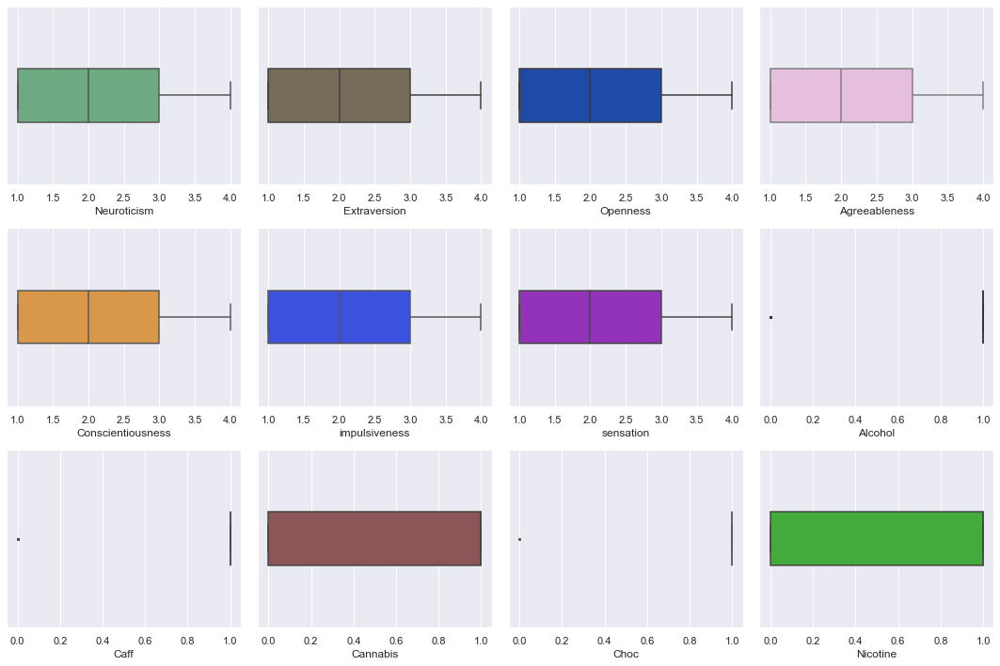

In [25]:
fig, axes = plt.subplots(3,4,figsize=[15,10])
num_cols=data[['Neuroticism', 'Extraversion', 'Openness', 'Agreeableness',
       'Conscientiousness', 'impulsiveness', 'sensation', 'Alcohol', 'Caff',
       'Cannabis', 'Choc', 'Nicotine']]
for i, col in enumerate(num_cols):
    sns.boxplot(x=col,color=np.random.rand(4,), data=data, ax=axes[i//4,i%4],fliersize=1,width=0.3)

plt.tight_layout()

As it has been presented in table above, alcohol, caffeine, cannabis, chocolate and nicotine are commonly used among respondents. 

**Target variable creation**

A person is considered as a drug user if he/she has used one of the drugs below in the past year:
* Amphetamine (Amphet)
* Amyl nitrite (Amyl)
* Benzodiazepine (Benzos)
* Cocaine (Coke)
* Crack
* Ecstasy
* Heroin
* Ketamine
* Legal highs (Legalh)
* LSD
* Methadone (Meth)
* Magic mushrooms (Mushrooms)
* Volatile substance abuse (VSA)

Substances such as nicotine, alcohol, caffeine, cannabis and chocolate are excluded from the target variable as being legal (in some of the countries surveyed) and/or commonly (over 50% of respondents) used. Variable *Semer* which is a fake drug and was introduced to identify over-claimers was dropped due to low relevancy in this particular modeling problem and low frequency.

In [26]:
data = data.assign(drug_use_tmp = data.Amphet+ data.Amyl+ data.Benzos +data.Coke+ data.Crack+data.Ectasy+data.Heroin+data.Ketamine+data.Legalh+data.LSD+data.Meth+data.Mushrooms+data.VSA)

In [27]:
data = data.assign(drug_use = np.nan)

In [28]:
data['drug_use'] = data['drug_use_tmp'].apply(lambda x: 1 if x >0 else 0)


In [29]:
#Dropping columns that has been replaced or are irrelevant (Semer, fake drug, is not helpful in this analysis)
data.drop(['id','drug_use_tmp', 'Amphet', 'Amyl', 'Benzos'
                , 'Coke'
                ,'Crack', 'Ectasy', 'Heroin', 'Ketamine'
                , 'Legalh', 'LSD', 'Meth', 'Mushrooms', 'Semer', 'VSA'],                 
                    axis = 1, inplace = True)


In [31]:
data['drug_use'].describe()

count    1885.000000
mean        0.554377
std         0.497166
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: drug_use, dtype: float64

55% of observations is tagged as a drug user. It means that the dataset is balanced and there is no need to oversample the data.

In [467]:
#Replacing categorisation variables with dummies
data_cat = pd.get_dummies(data, columns=data.describe(include=['O']).columns, prefix = data.describe(include=['O']).columns)

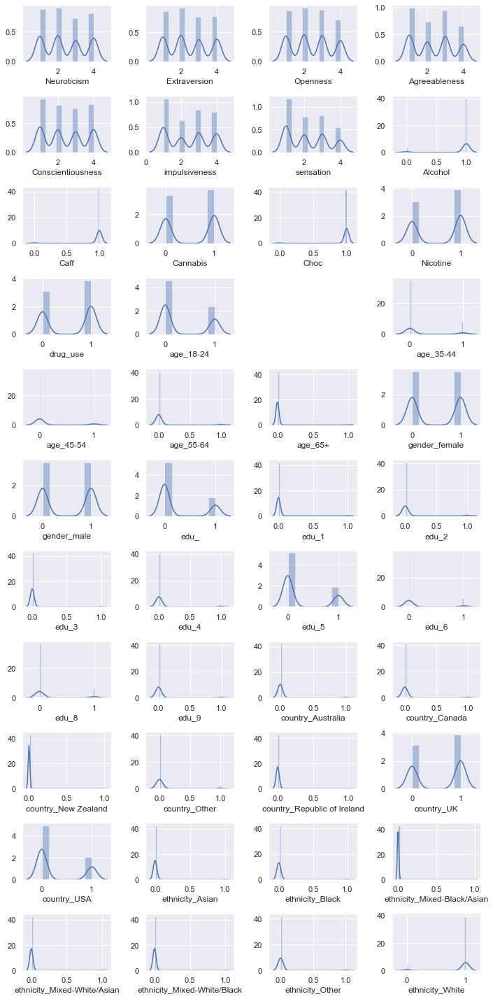

In [468]:
fig, axes = plt.subplots(11,4,figsize=[10,20])
num_cols=data_cat.select_dtypes(include=np.number).columns
for i, col in enumerate(num_cols):
    sns.distplot(data_cat[col],ax=axes[i//4,i%4])
fig.delaxes(axes[3,2])
plt.tight_layout()

**Relationships with target variable**

Correlation matrix

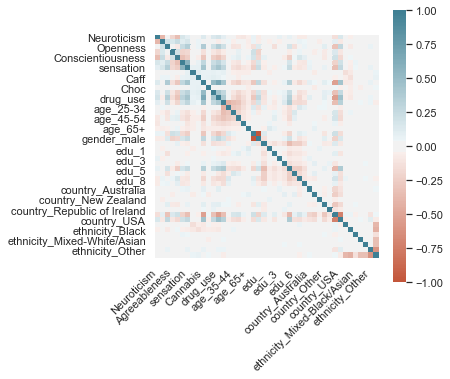

In [469]:
corr = data_cat.corr()
plt.rcParams['figure.figsize'] = [5,5]
ax = sns.heatmap(corr, square = True, cmap=sns.diverging_palette(20, 220, n=200))
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right');


Only significant correlations

In [470]:
import copy
#Caluclating p-value for each correlation value
corr = data_cat.corr()
corr_new = copy.deepcopy(corr)
corr_p = copy.deepcopy(corr)
for i in np.arange(1,corr.shape[0]):
    for j in np.arange(1,corr.shape[1]):
        corr_p.iloc[i,j] = stats.stats.pearsonr( data_cat[corr.index.values[i]], data_cat[corr.columns[j]] )[1]

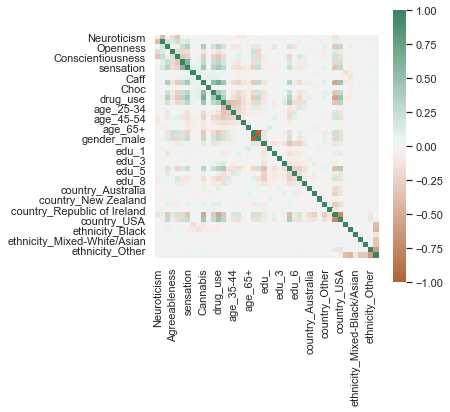

In [471]:
indices = corr_p > 0.05
corr_new[indices] = 0
plt.rcParams['figure.figsize'] = [5,5]
ax = sns.heatmap(corr_new, square = True,
                vmin = -1, vmax = 1, center = 0,
                cmap=sns.diverging_palette(30, 150, n=200))

Since number of variables is significant and there are several correlations visible on the charts above, relationships are studied more carefully each by each. Variables were divided into 4 groups to ensure readability. Correlations with target variable are presented below.

Group 1

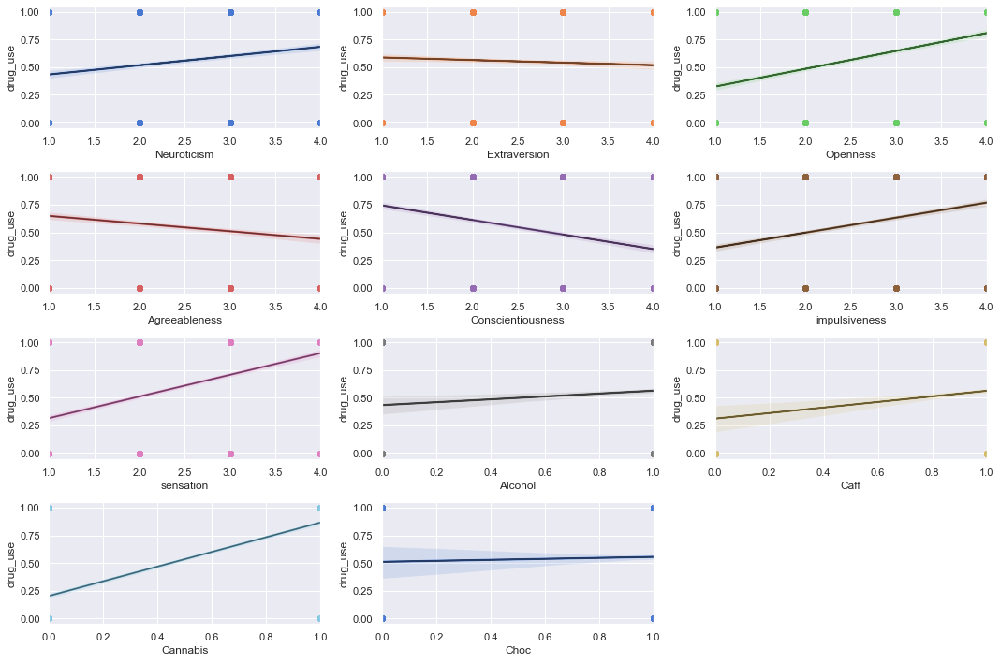

In [472]:
num_cols = data_cat.iloc[:,0:12].select_dtypes(include=np.number).columns
fig, axes = plt.subplots(4,3,figsize=[15,10])
for i, col in enumerate(num_cols):
    c_ax=axes[i//3,i%3]
    sns.regplot(x=col,y='drug_use', color=sns.color_palette("muted", n_colors=12)[i], 
                data=data_cat, ax=c_ax)
    slope, intercept, *_ = stats.linregress(data_cat[col],data_cat['drug_use'])
    #function is returning around 5 values and we are unpacking it, but we are using only intercept and underscore variable 
    line = slope*data_cat[col]+intercept
    c_ax.plot(data_cat[col], line, 'black', alpha=0.5)
fig.delaxes(axes[3,2])
plt.tight_layout()

Neuroticism, openness, impulsiveness, sensation and cannabis have slightly positive impact on drug usage.
Agreebeleness and conscientiousness are the only variable in this group that have negative impact.
Extraversion, alcohol, caffeine and chocolate consumption does not seem to have an effect on target variable.

Group 2

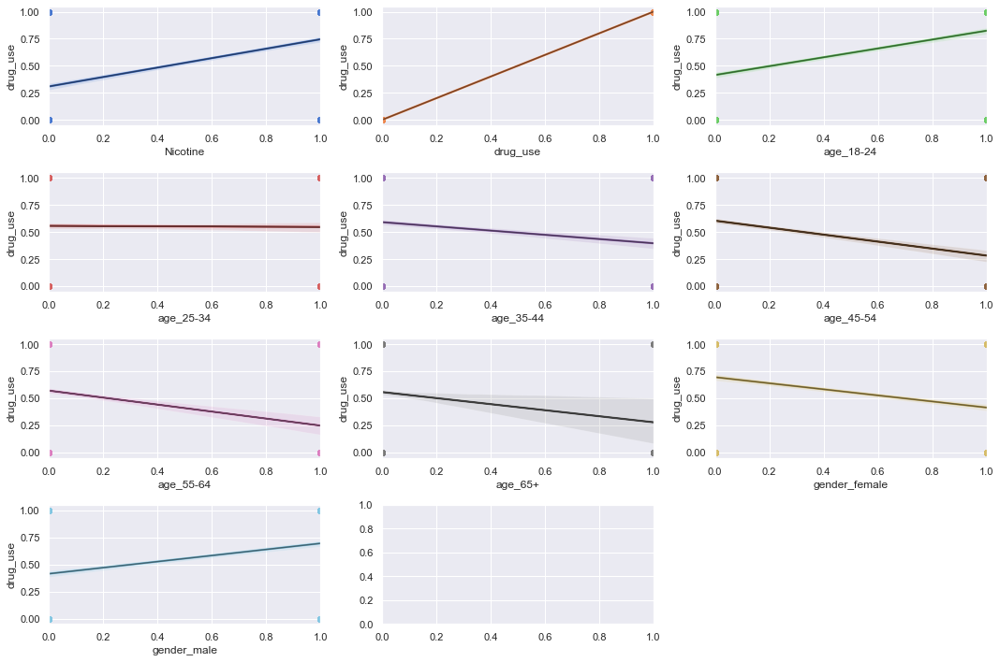

In [473]:
num_cols = data_cat.iloc[:,11:21].select_dtypes(include=np.number).columns
fig, axes = plt.subplots(4,3,figsize=[15,10])
for i, col in enumerate(num_cols):
    c_ax=axes[i//3,i%3]
    sns.regplot(x=col,y='drug_use', color=sns.color_palette("muted", n_colors=15)[i], 
                data=data_cat, ax=c_ax)
    slope, intercept, *_ = stats.linregress(data_cat[col],data_cat['drug_use'])
    #function is returning around 5 values and we are unpacking it, but we are using only intercept and underscore variable 
    line = slope*data_cat[col]+intercept
    c_ax.plot(data_cat[col], line, 'black', alpha=0.5)
fig.delaxes(axes[3,2])
plt.tight_layout()

Nicotine consumption, being young (below 24 years old) and being a men increase chances for drug consumption.
Being older (above 45 years old) and being a female decreases probability of drug usage.

Group 3

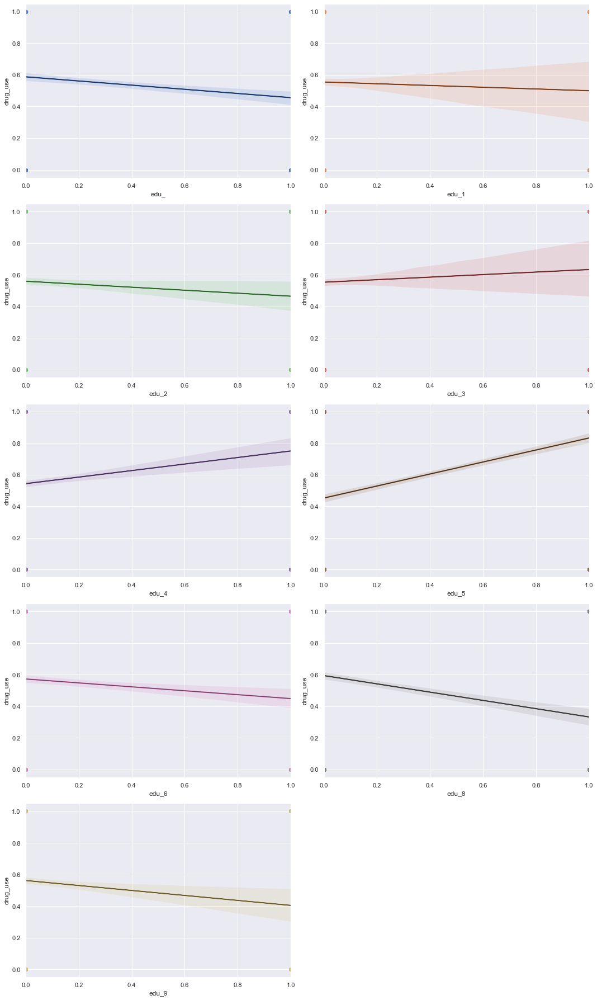

In [474]:
num_cols = data_cat.iloc[:,21:30].select_dtypes(include=np.number).columns
fig, axes = plt.subplots(5,2,figsize=[15,25])
for i, col in enumerate(num_cols):
    c_ax=axes[i//2,i%2]
    sns.regplot(x=col,y='drug_use', color=sns.color_palette("muted", n_colors=15)[i], 
                data=data_cat, ax=c_ax)
    slope, intercept, *_ = stats.linregress(data_cat[col],data_cat['drug_use'])
    #function is returning around 5 values and we are unpacking it, but we are using only intercept and underscore variable 
    line = slope*data_cat[col]+intercept
    c_ax.plot(data_cat[col], line, 'black', alpha=0.5)
fig.delaxes(axes[4,1])
plt.tight_layout()

Higher level of education favors a tendency to drug usage until some point - for levels 4 (left school at 18 years) and 5 (some college or university but no certificate or degree) the probability is higher than for the lower levels but for level 6 and above the probability is decreasing (professional certifiacate/diploma, masters or doctorate degree).

Group 4

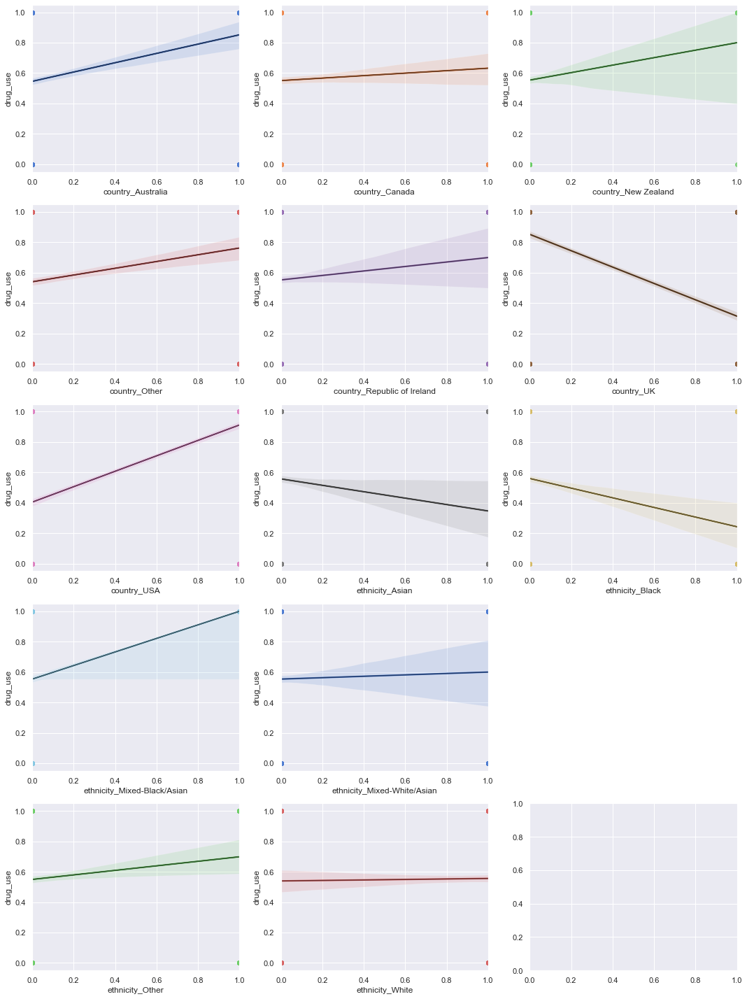

In [475]:
num_cols = data_cat.iloc[:,30:45].select_dtypes(include=np.number).columns
fig, axes = plt.subplots(5,3,figsize=[15,20])
for i, col in enumerate(num_cols):
    c_ax=axes[i//3,i%3]
    sns.regplot(x=col,y='drug_use', color=sns.color_palette("muted", n_colors=15)[i], 
                data=data_cat, ax=c_ax)
    slope, intercept, *_ = stats.linregress(data_cat[col],data_cat['drug_use'])
    #function is returning around 5 values and we are unpacking it, but we are using only intercept and underscore variable 
    line = slope*data_cat[col]+intercept
    c_ax.plot(data_cat[col], line, 'black', alpha=0.5)
fig.delaxes(axes[3,2])
plt.tight_layout()

The only country in which the probability of using drugs is lower is the United Kingdom. For Canada there is no correaltion between the country and drug usage. People of Asian and Black ethnicity seem to use drugs less than the others but mixed Black/Asian have higher probability. 

**Summary of EDA**

Several variables studied seem to have a positive or negative effect on target variable. Only few presented below may be dropped as there is no significant correlations between them and drug usage:
- caffeine consumption
- chocolate consumption
- alcohol consumption
- extraversion

---

## Part 4: Models creation

### Preparation of dataset

In [476]:
data_clean = data_cat

In [477]:
data_clean.drop(['Caff', 'Choc', 'Alcohol', 'Extraversion'],axis=1, inplace=True)

In [478]:
#Splitting data into train and test
X = data_clean.drop(['drug_use'],axis=1)
y = data_clean['drug_use']
%time X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.3, random_state = 1)

Wall time: 20.1 ms


### Decision tree

In [479]:
CART = tree.DecisionTreeRegressor(random_state=42,ccp_alpha=0.0)
CART_model=CART.fit(X_train,y_train)

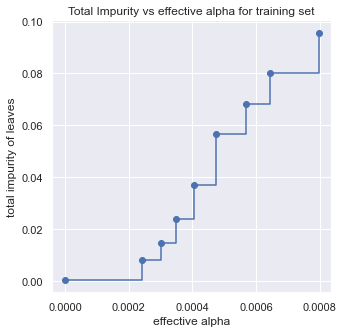

In [480]:
path = CART.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas[::10], path.impurities[::10]
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set");

In [481]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = tree.DecisionTreeRegressor(random_state=42, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 15 with ccp_alpha: 0.0013609710740171144


In [482]:
def RMSE(model,X,y):
    return np.sqrt(((model.predict(X)-y)**2).mean())

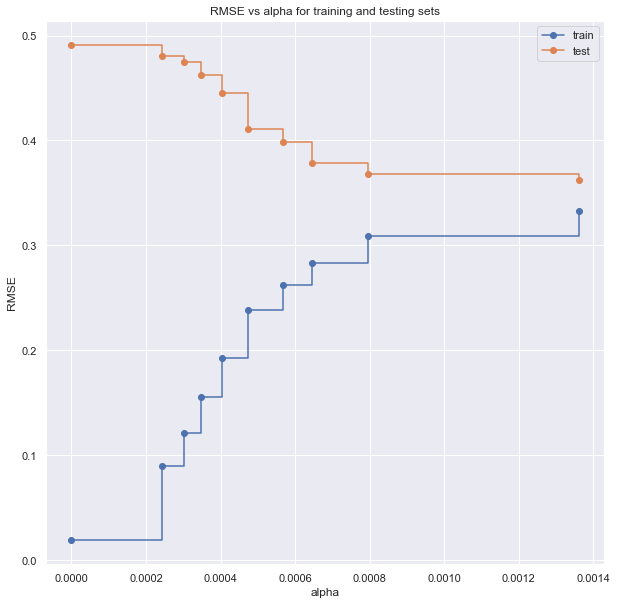

In [483]:
test_scores = [RMSE(clf,X_test,y_test) for clf in clfs]
train_scores = [RMSE(clf,X_train,y_train) for clf in clfs]

fig, ax = plt.subplots(figsize=[10,10])
ax.set_xlabel("alpha")
ax.set_ylabel("RMSE")
ax.set_title("RMSE vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [484]:
Best_CART = clfs[np.argmin(test_scores)]
Best_CART.ccp_alpha

0.0013609710740171144

In [485]:
min(test_scores)

0.3619852936960602

Best regression tree (measured by the least root mean squared error) is produced by complexity parameter ccp_alpha equal to 0.00136. RMSE equals 0.3619.

In [486]:
confmat = pd.crosstab(Best_CART.predict(X_test).round(),y_test.round())
confmat

drug_use,0,1
row_0,,
0.0,194,44
1.0,46,282


In [487]:
CART_accuracy = np.array([confmat.loc[i,i] for i in confmat.index]).sum()/confmat.sum().sum()
CART_accuracy

0.8409893992932862

Accuracy of the model equals 84%

### Random forest

In [488]:
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor

In [489]:
#Checking number of tress influence on RMSE
rfr = RandomForestRegressor
N = [10,50,100,150, 200,250,300,350,400,450,500,550, 600,650, 700,750, 800,850, 900,950, 1000]
RMSE_RF= [RMSE(rfr(n,n_jobs=-1).fit(X_train,y_train),X_test,y_test) for n in N]

In [490]:
fig = go.Figure(go.Scatter(x=N, y=RMSE_RF))
fig.update_layout(
    title="RMSE vs number of trees (random forest)",
    xaxis_title="Number of trees",
    yaxis_title="RMSE",
)

fig.show(renderer="notebook")

In [491]:
print('Number of trees minimizing RMSE: ', N[np.argmin(RMSE_RF)])

Number of trees minimizing RMSE:  300


In [511]:
#Checking number of features influence on RMSE
features = np.linspace(1,X_train.shape[1],100).astype(int)
RMSE_RF_features= [RMSE(rfr(300,max_features=n,n_jobs=-1).fit(X_train,y_train),X_test,y_test) for n in features]

In [512]:
fig = go.Figure(go.Scatter(x=features, y=RMSE_RF_features))
fig.update_layout(
    title="RMSE vs number of features (random forest)",
    xaxis_title="Number of features",
    yaxis_title="RMSE",
)

fig.show(renderer="notebook")

In [513]:
print('Number of features minimizing RMSE: ', features[np.argmin(RMSE_RF_features)])

Number of features minimizing RMSE:  2


In [514]:
Best_RF = RandomForestRegressor(300,max_features=2,n_jobs=-1).fit(X_train,y_train)

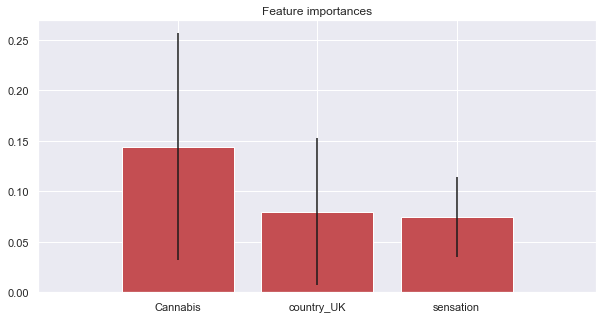

In [516]:
# Plot the feature importances of the forest
importances = Best_RF.feature_importances_
std = np.std([tree.feature_importances_ for tree in Best_RF.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

num_feat = 3
plt.figure(figsize=[10,5])
plt.title("Feature importances")
plt.bar(range(num_feat)[:num_feat], importances[indices][:num_feat],
       color="r", yerr=std[indices][:num_feat], align="center")
plt.xticks(range(num_feat)[:num_feat], X_train.columns[indices])
plt.xlim([-1, num_feat])
plt.show()

Tree variables that are important in predicing drug usage are:
- cannabis usage
- country (the United Kingdom)
- level of sensation

In [517]:
confmat_RF = pd.crosstab(Best_RF.predict(X_test).round(),y_test.round())
confmat_RF

drug_use,0,1
row_0,,
0.0,197,49
1.0,43,277


In [518]:
rf_accuracy = np.array([confmat_RF.loc[i,i] for i in confmat_RF.index]).sum()/confmat_RF.sum().sum()
rf_accuracy

0.8374558303886925

Random forest model has accuracy of 83,745%

### Gradient Boost

In [519]:
#Checking number of boosting stages influence on RMSE
gbr = GradientBoostingRegressor
N = [10,15,20,25,30,35,40,45,50,70,100,200,300,400,500,600,700,800,900,1000]
RMSE_GBT = [RMSE(gbr(n_estimators=n, learning_rate=0.1, alpha=0.2).fit(X_train,y_train),X_test,y_test) for n in N]

In [520]:
fig = go.Figure(go.Scatter(x=N, y=RMSE_GBT))
fig.update_layout(
    title="RMSE vs number of boosting stages (gradient boosting)",
    xaxis_title="Number of boosting stages",
    yaxis_title="RMSE"
)

fig.show(renderer="notebook")

In [521]:
print('Number of boosting stages minimizing RMSE: ', N[np.argmin(RMSE_GBT)])

Number of boosting stages minimizing RMSE:  30


In [522]:
Best_GBT = GradientBoostingRegressor(n_estimators=30,learning_rate=0.05).fit(X_train,y_train)

In [523]:
#But we can view this as multiclass classification
confmat_GBT = pd.crosstab(Best_GBT.predict(X_test).round(),y_test.round())
confmat_GBT

drug_use,0,1
row_0,,
0.0,194,45
1.0,46,281


In [524]:
#Accuracy
gbt_accuracy = np.array([confmat_GBT.loc[i,i] for i in confmat_GBT.index]).sum()/confmat_GBT.sum().sum()
gbt_accuracy

0.8392226148409894

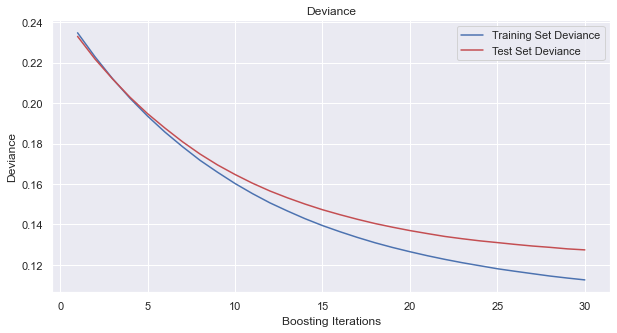

In [525]:
# Comparison of deviance between training and test set
test_score = np.zeros((30,), dtype=np.float64)

for i, y_pred in enumerate(Best_GBT.staged_predict(X_test)):
    test_score[i] = Best_GBT.loss_(y_test, y_pred)

plt.figure(figsize=(10,5))
plt.title('Deviance')
plt.plot(np.arange(30) + 1, Best_GBT.train_score_, 'b-',
         label='Training Set Deviance')
plt.plot(np.arange(30) + 1, test_score, 'r-',
         label='Test Set Deviance')
plt.legend(loc='upper right')
plt.xlabel('Boosting Iterations')
plt.ylabel('Deviance');

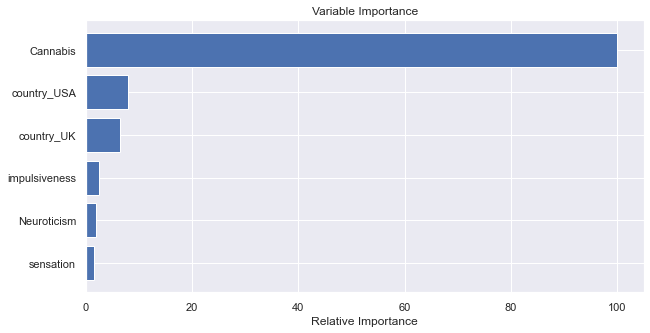

In [526]:
# Plot feature importance
feature_importance = Best_GBT.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
num_feat = 6
plt.figure(figsize=[10,5])
plt.barh(pos[-num_feat:], feature_importance[sorted_idx][-num_feat:], align='center')
plt.yticks(pos[-num_feat:], X_train.columns[sorted_idx][-num_feat:])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

Similar to random forest, cannabis is the most important variable. Second most important is country (USA) and country (UK)

---

## Part 5: Models assessment

In [527]:
models = [Best_CART, Best_RF, Best_GBT]
errors = [RMSE(m, X_test, y_test) for m in models]

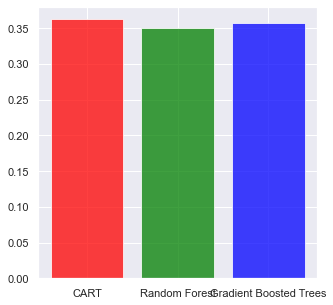

In [528]:
plt.bar(['CART','Random Forest','Gradient Boosted Trees'], errors, color=['red', 'green', 'blue'], alpha=0.75);

In [529]:
acc = pd.DataFrame((CART_accuracy, rf_accuracy, gbt_accuracy),['CART', 'Random Forest', 'Gradient Boosted Trees'])

In [530]:
acc.columns = ['accuracy']
acc

,accuracy
CART,0.840989
Random Forest,0.837456
Gradient Boosted Trees,0.839223


All three models perform on similar level. The lowest root mean squared error was achieved for random forest model - 0.3517, but the highest accuracy was achieved in CART model - 84,1%.

---

### Part 6: Summary

Three models has been produced to predict the probability that a person with given characteristics had used drugs in the past year. Models used algorithms such as decision tree, random forest and gradient boosted trees. It turned out that each one of them gives similar results with accuracy about 84%.

Report encountered two main problems.First of all, dataset contained several variables including personality traits which values were very difficult to interpret. Relying on documentation they were transformed into 4 standardised levels based in their frequency in the dataset. Secondly, models has been trained in a way that avoids overfitting - decision tree was pruned to ensure that the final models minimizes root mean squared error on test dataset, random forest parameters such as number of trees and number of features and number of boosting stages in gradient boosting trees model were chosen by the same measure

For future research there was found several problems that can be encountered. First of all, there is little information about the origins of the dataset and after data pre-processing it turned out that over half of the respondents had used one of the drugs in the past year which may rise suspicions that respondents were selected in some specific way rather than being a random sample from the society (ratio of drug-users is surprisingly high). 
What is more, majority of respondents is of white ethnicity which can lead to biased results. It may be useful to repeat the analysis with greater variety of respondents, especially since there has been presented that some ethnicities have higher probability of using drugs.
Furthermore, it has been assumed that characteristics taken into consideration in the model will be available without much problem. Unfortunately, the most important variable in models is cannabis consumption what will cause difficulties in future predictions for obvious reasons.

Models does not present causes of drug consumption but characteristics that are correlated with it. It means that one should be very careful with interpretation of the results and its applications. Model can support decisions regarding e.g. implementation of preventing actions such as information campaigns targeted to specific groups of people. It must not be used to support decisions regarding specific people such as recruitment.
